# Visualizing Attractors

An [attractor](https://en.wikipedia.org/wiki/Attractor#Strange_attractor) is a set of values to which a numerical system tends to evolve. An attractor is called a [strange attractor](https://en.wikipedia.org/wiki/Attractor#Strange_attractor) if the resulting pattern has a fractal structure. This notebook shows how to calculate and plot two-dimensional attractors of a variety of types, using code and parameters primarily from [L&aacute;zaro Alonso](https://lazarusa.github.io/Webpage/codepython2.html), [François Pacull](https://aetperf.github.io/2018/08/29/Plotting-Hopalong-attractor-with-Datashader-and-Numba.html), [Jason Rampe](https://softologyblog.wordpress.com/2017/03/04/2d-strange-attractors), [Paul Bourke](http://paulbourke.net/fractals/), and [James A. Bednar](http://github.io/jbednar).


## Clifford Attractors

For example, a [Clifford Attractor](http://paulbourke.net/fractals/clifford) is a strange attractor defined by two iterative equations that determine the _x,y_ locations of discrete steps in the path of a particle across a 2D space, given a starting point _(x0,y0)_ and the values of four parameters _(a,b,c,d)_:

\begin{equation}
x_{n +1} = \sin(a y_{n}) + c \cos(a x_{n})\\
y_{n +1} = \sin(b x_{n}) + d \cos(b y_{n})
\end{equation}

At each time step, the equations define the location for the following time step, and the accumulated locations show the areas of the 2D plane most commonly visited by the imaginary particle.  

It's easy to calculate these values in Python using [Numba](http://numba.pydata.org). First, we define the iterative attractor equation:

In [1]:
import numpy as np, pandas as pd, datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import inferno, viridis
from numba import jit
from math import sin, cos, sqrt, fabs

@jit(nopython=True)
def Clifford(x, y, a, b, c, d, *o):
    return sin(a * y) + c * cos(a * x), \
           sin(b * x) + d * cos(b * y)

We then evaluate this equation 10 million times, creating a set of _x,y_ coordinates visited. The `@jit` here and above is optional, but it makes the code 50x faster.

In [2]:
n=10000000

@jit(nopython=True)
def trajectory_coords(fn, x0, y0, a, b=0, c=0, d=0, e=0, f=0, n=n):
    x, y = np.zeros(n), np.zeros(n)
    x[0], y[0] = x0, y0
    for i in np.arange(n-1):
        x[i+1], y[i+1] = fn(x[i], y[i], a, b, c, d, e, f)
    return x,y

def trajectory(fn, x0, y0, a, b=0, c=0, d=0, e=0, f=0, n=n):
    x, y = trajectory_coords(fn, x0, y0, a, b, c, d, e, f, n)
    return pd.DataFrame(dict(x=x,y=y))

In [3]:
%%time
df = trajectory(Clifford, 0, 0, -1.3, -1.3, -1.8, -1.9)

CPU times: user 1.28 s, sys: 236 ms, total: 1.52 s
Wall time: 1.52 s


In [4]:
df.tail()

,x,y
9999995,1.857884,1.395837
9999996,0.375264,-0.205512
9999997,-1.326024,-2.301316
9999998,0.423711,2.867012
9999999,-0.981134,1.060115


We can now aggregate these 10,000,000 continuous coordinates into a discrete 2D rectangular grid with [Datashader](http://datashader.org), counting each time a point fell into that grid cell:

In [5]:
%%time

cvs = ds.Canvas(plot_width = 700, plot_height = 700)
agg = cvs.points(df, 'x', 'y')
print(agg.values[190:195,190:195],"\n")

[[ 37  41  26  24  24]
 [ 28  30  42  27  26]
 [111  53  29  37  28]
 [145 177 113  63  44]
 [ 78  94 136 140  96]] 

CPU times: user 533 ms, sys: 11.9 ms, total: 545 ms
Wall time: 545 ms


A small portion of that grid is shown above, but it's difficult to see the grid's structure from the numerical values.  To see the entire array at once, we can turn each grid cell into a pixel, using a greyscale value from white to black:

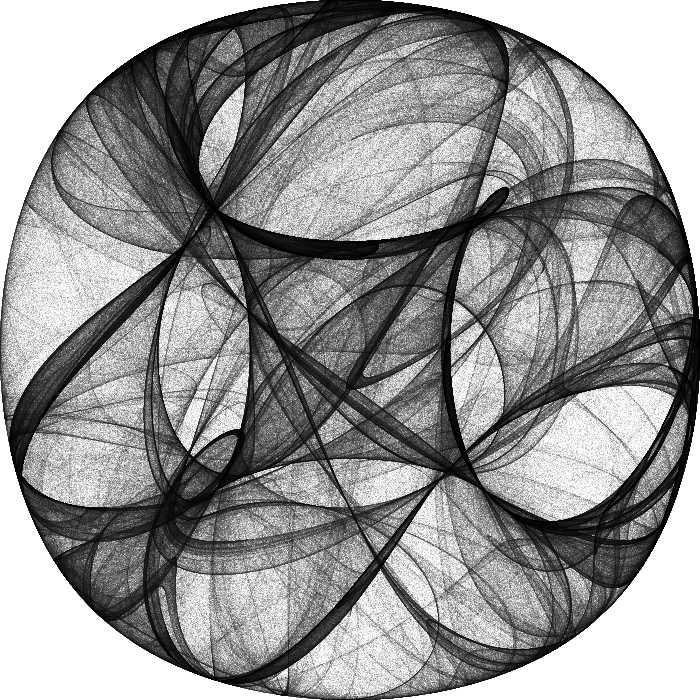

In [6]:
ds.transfer_functions.Image.border=0

tf.shade(agg, cmap = ["white", "black"])

As you can see, the most-visited areas of the plane have an interesting structure for this set of parameters. To explore further, let's wrap up the above aggregation and shading commands into a function so we can apply them more easily:

In [7]:
def dsplot(fn, vals, n=n, cmap=viridis, label=True):
    """Return a Datashader image by collecting `n` trajectory points for the given attractor `fn`"""
    lab = ("{}, "*(len(vals)-1)+" {}").format(*vals) if label else None
    df  = trajectory(fn, *vals, n=n)
    cvs = ds.Canvas(plot_width = 300, plot_height = 300)
    agg = cvs.points(df, 'x', 'y')
    img = tf.shade(agg, cmap=cmap, name=lab)
    return img

And let's load some colormaps that we can use for subsequent plots:

In [8]:
from colorcet import palette
palette["viridis"]=viridis
palette["inferno"]=inferno

We can now use these colormaps with a pre-selected set of Clifford attractor parameter values (stored in a separate [YAML-format text file](https://raw.githubusercontent.com/holoviz-topics/examples/main/attractors/strange_attractors.yml)) to show a wide variety of trajectories that these equations can form:

In [9]:
import yaml
vals = yaml.load(open("data/strange_attractors.yml","r"), Loader=yaml.FullLoader)

def args(name):
    """Return a list of available argument lists for the given type of attractor"""
    return [v[1:] for v in vals if v[0]==name]

def plot(fn, vals=None, **kw):
    """Plot the given attractor `fn` once per provided set of arguments."""
    vargs=args(fn.__name__) if vals is None else vals
    return tf.Images(*[dsplot(fn, v[1:], cmap=palette[v[0]][::-1], **kw) for v in vargs]).cols(4)

"0, 0, -1.3, -1.3, -1.8, -1.9","0, 0, -1.4, 1.6, 1.0, 0.7","0, 0, 1.7, 1.7, 0.6, 1.2","0, 0, 1.7, 0.7, 1.4, 2.0"
"0, 0, -1.7, 1.8, -1.9, -0.4","0, 0, 1.1, -1.32, -1.03, 1.54","0, 0, 0.77, 1.99, -1.31, -1.45","0, 0, -1.9, -1.9, -1.9, -1.0"
"0, 0, 0.75, 1.34, -1.93, 1.0","0, 0, -1.32, -1.65, 0.74, 1.81","0, 0, -1.6, 1.6, 0.7, -1.0","0, 0, -1.7, 1.5, -0.5, 0.7"

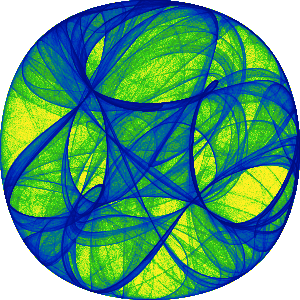
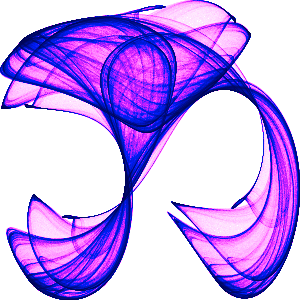
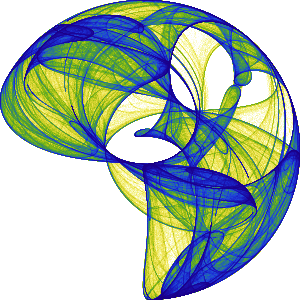
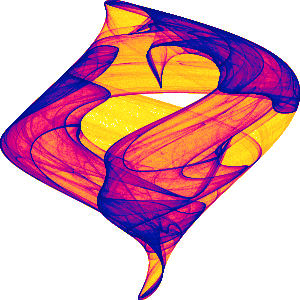
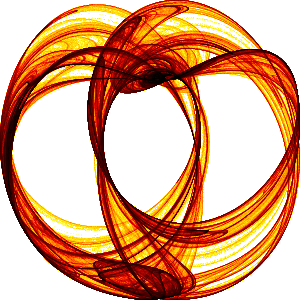
...
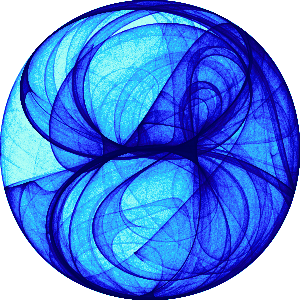
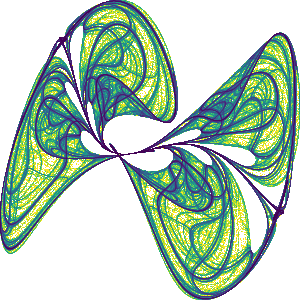
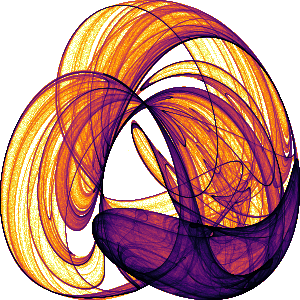
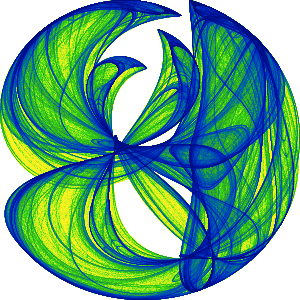
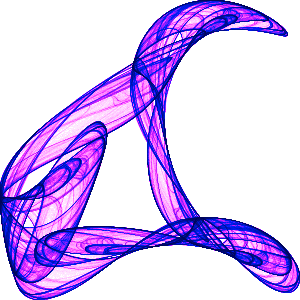

In [10]:
plot(Clifford)

Here the values shown are the arguments for the first call to `Clifford(x, y, a, b, c, d)`, with each subsequent call using the _x,y_ location of the previous call.  

Randomly sampling the parameter space typically yields much less dramatic patterns, such as all trajectory locations being on a small number of points:

"0.0, 0.0, -1.8051004767634908, -0.8435613608407326, 0.8838653873249194, -1.9135350003362008","0.0, 0.0, -1.176308938930244, -1.7969069732184928, -0.7909124241415326, 0.6556411784987999","0.0, 0.0, -0.7675424270524847, 0.33436510487439497, -1.7217161815495978, 1.4696179359723534","0.0, 0.0, -1.467037922993009, -1.2875013537620066, -0.01628180069537688, 1.4547985782328943"

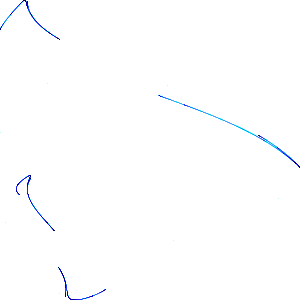
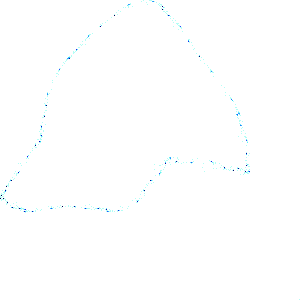
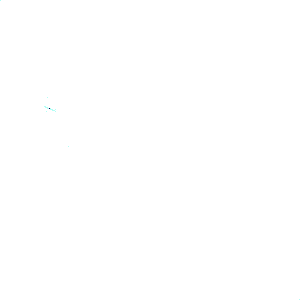
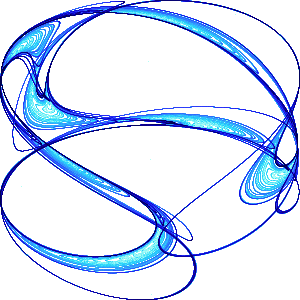

In [11]:
import numpy.random
numpy.random.seed(21)
num = 4

rvals=np.c_[np.zeros((num,2)), numpy.random.random((num,4))*4-2]
plot(Clifford, vals=[["kbc"]+list(rvals[i]) for i in range(len(rvals))], label=True)

If you wish, Datashader could easily be used to filter out such uninteresting examples, by applying a criterion to the aggregate array before shading and showing only those that remain (e.g. rejecting those where 80% of the pixel bins are empty).


## De Jong attractors

A variety of other sets of attractor equations have been proposed, such as these from [Peter de Jong](http://paulbourke.net/fractals/peterdejong):

"0, 0, -1.244, -1.251, -1.815, -1.908","0, 0, 1.7, 1.7, 0.6, 1.2","0, 0, 1.4, -2.3, 2.4, -2.1","0, 0, -2.7, -0.09, -0.86, -2.2"
"0, 0, -0.827, -1.637, 1.659, -0.943","0, 0, -2.24, 0.43, -0.65, -2.43","0, 0, 2.01, -2.53, 1.61, -0.33","0, 0, 1.4, 1.56, 1.4, -6.56"

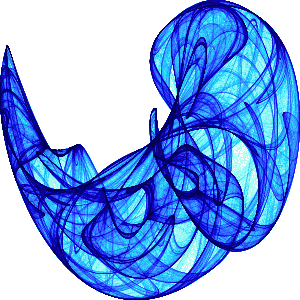
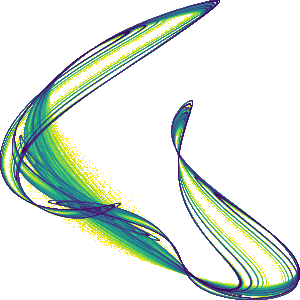
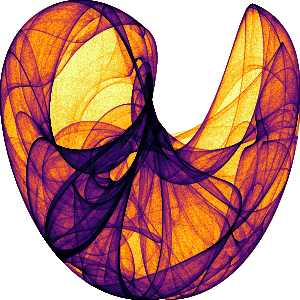
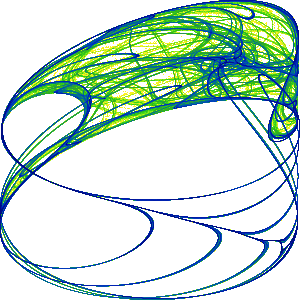
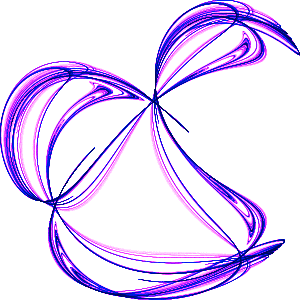
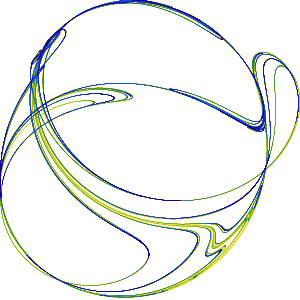
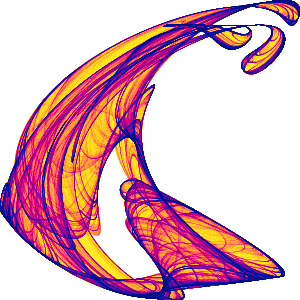
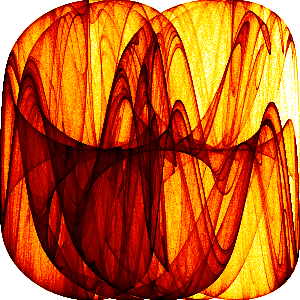

In [12]:
@jit(nopython=True)
def De_Jong(x, y, a, b, c, d, *o):
    return sin(a * y) - cos(b * x), \
           sin(c * x) - cos(d * y)

plot(De_Jong)

## Svensson attractors

From [Johnny Svensson](http://paulbourke.net/fractals/peterdejong/):

"0, 0, 1.5, -1.8, 1.6, 0.9","0, 0, -1.78, 1.29, -0.09, -1.18","0, 0, -0.91, -1.29, -1.97, -1.56","0, 0, 1.4, 1.56, 1.4, -6.56"

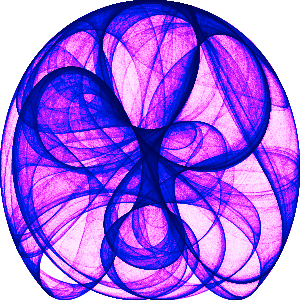
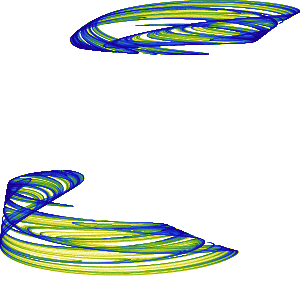
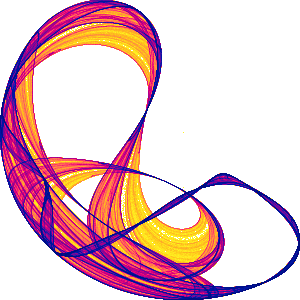
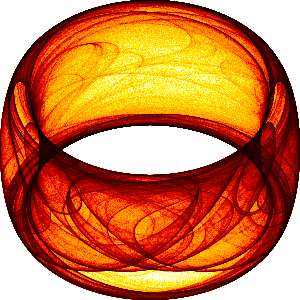

In [13]:
@jit(nopython=True)
def Svensson(x, y, a, b, c, d, *o):
    return d * sin(a * x) - sin(b * y), \
           c * cos(a * x) + cos(b * y)

plot(Svensson)

## Bedhead Attractor

From [Ivan Emrich](https://www.deviantart.com/jaguarfacedman) and [Jason Rampe](https://softologyblog.wordpress.com/2017/03/04/2d-strange-attractors):

"1, 1, -0.81, -0.92","1, 1, -0.64, 0.76","1, 1, 0.06, 0.98","1, 1, -0.67, 0.83"

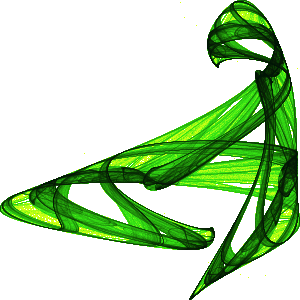
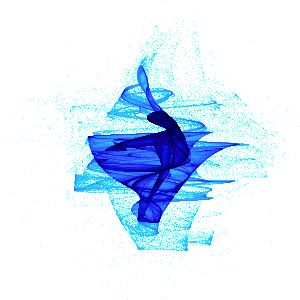
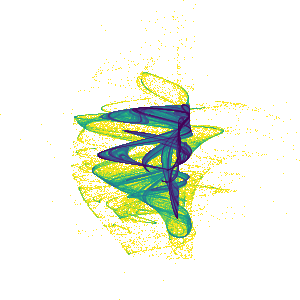
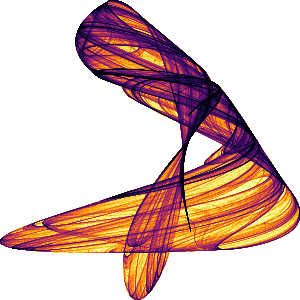

In [14]:
@jit(nopython=True)
def Bedhead(x, y, a, b, *o):
    return sin(x*y/b)*y + cos(a*x-y), \
           x + sin(y)/b

plot(Bedhead)

## Fractal Dream Attractor

From Clifford A. Pickover's book “Chaos In Wonderland”, with parameters from [Jason Rampe](https://softologyblog.wordpress.com/2017/03/04/2d-strange-attractors):

"0.1, 0.1, -0.966918, 2.879879, 0.765145, 0.744728","0.1, 0.1, -2.8276, 1.2813, 1.9655, 0.597","0.1, 0.1, -1.1554, -2.3419, -1.9799, 2.1828","0.1, 0.1, -1.9956, -1.4528, -2.6206, 0.8517"

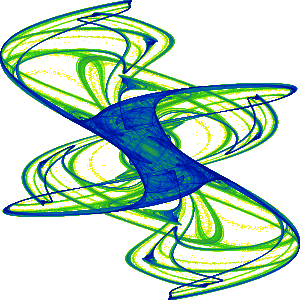
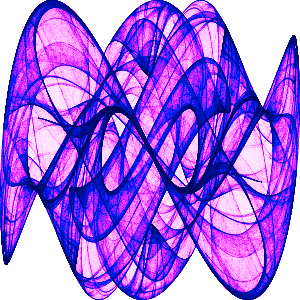
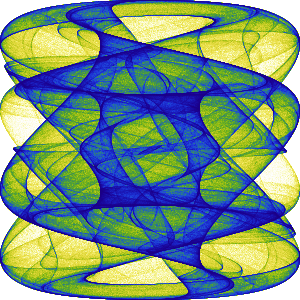
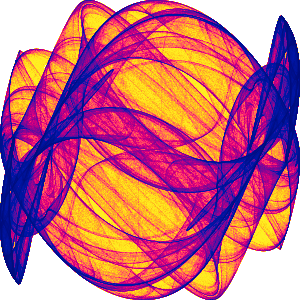

In [15]:
@jit(nopython=True)
def Fractal_Dream(x, y, a, b, c, d, *o):
    return sin(y*b)+c*sin(x*b), \
           sin(x*a)+d*sin(y*a)

plot(Fractal_Dream)

## Hopalong attractors

From Barry Martin, here with code for two variants from [François Pacull](https://aetperf.github.io/2018/08/29/Plotting-Hopalong-attractor-with-Datashader-and-Numba.html):

"0, 0, 2.0, 1.0, 0.0","0, 0, -11.0, 0.05, 0.5","0, 0, 2.0, 0.05, 2.0","0, 0, 1.1, 0.5, 1.0"

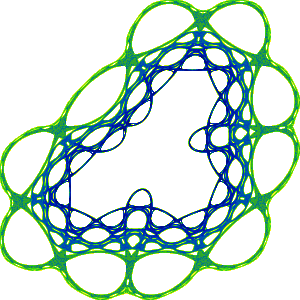
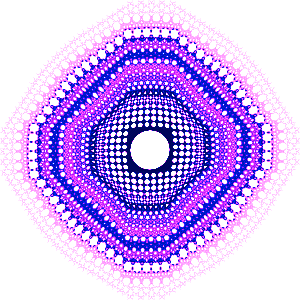
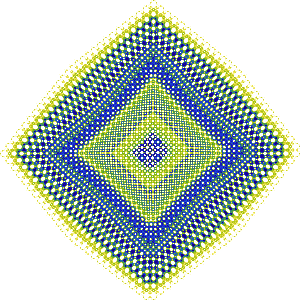
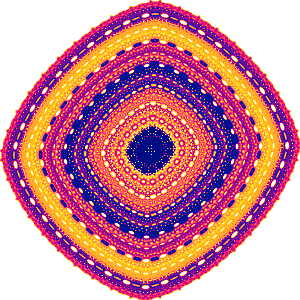

In [16]:
@jit(nopython=True)
def Hopalong1(x, y, a, b, c, *o):
    return y - sqrt(fabs(b * x - c)) * np.sign(x), \
           a - x
@jit(nopython=True)
def Hopalong2(x, y, a, b, c, *o):
    return y - 1.0 - sqrt(fabs(b * x - 1.0 - c)) * np.sign(x - 1.0), \
           a - x - 1.0

plot(Hopalong1)

"0, 0, 7.17, 8.44, 2.56","0, 0, 7.8, 0.13, 8.15","0, 0, 9.7, 1.6, 7.9"

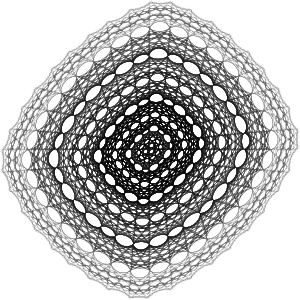
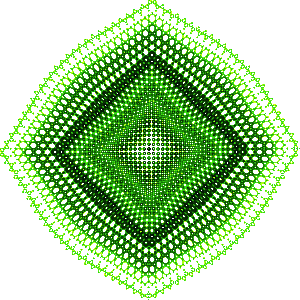
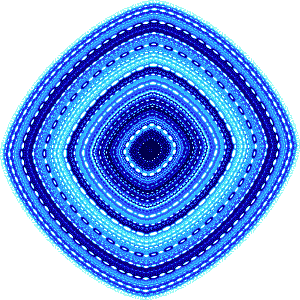

In [17]:
plot(Hopalong2)

##  Gumowski-Mira Attractor

From [I. Gumowski and C. Mira](http://kgdawiec.bplaced.net/badania/pdf/cacs_2010.pdf), with code and parameters from [Jason Rampe](https://softologyblog.wordpress.com/2017/03/04/2d-strange-attractors) and [L&aacute;zaro Alonso](https://lazarusa.github.io/Webpage/codepython2.html):

"0.1, 0.1, 0.0, 0.5, -0.75","0, 1, 0.008, 0.05, -0.496","0.1, 0.1, 0.0, 0.5, -0.7509","0, 1, 0.0, 0.5, -0.22"
"0, 1, 0.008, 0.05, -0.9","0, 1, 0.008, 0.05, -0.45","0.1, 0.1, 0.008, 0.05, 0.16","0, 0.5, 0.008, 0.05, -0.7"
"0.5, 0, 0.0, 0.05, -0.2","0.5, 0.5, 0.0, 0.05, -0.22","0, 0.5, 0.0, 0.05, -0.31","0, 0.5, 0.0, 0.05, -0.55"
"0.5, 0.5, 0.0, 0.05, -0.23","0.5, 0.5, 0.009, 0.05, 0.32","0.1, 0.1, 0.0, 0.5, -0.65","0.0, 0.5, 0.0, 0, -0.578"
"0.0, 0.5, 0.0, 0, -0.604","0.0, 0.5, 0.0, 0, 0.228","0.0, 0.5, 0.0, 0, -0.002","0.0, 0.5, 0.0, 0, -0.623"

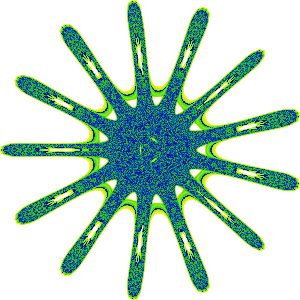
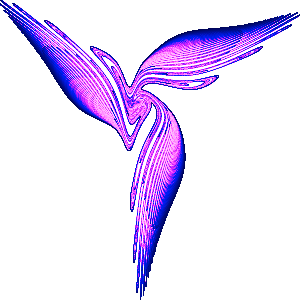
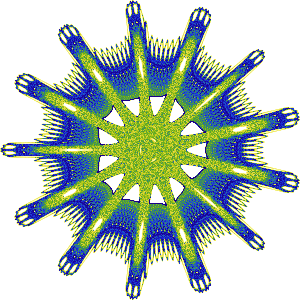
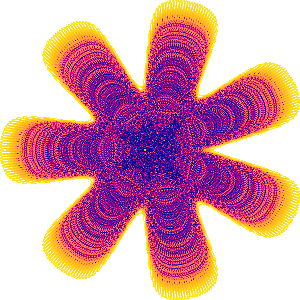
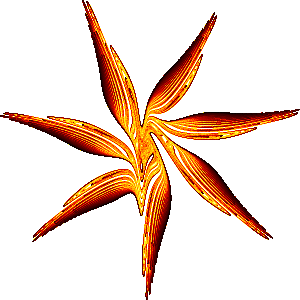
...
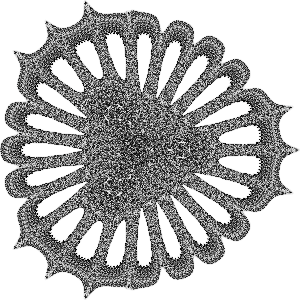
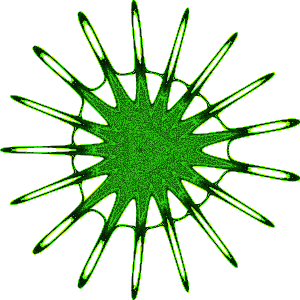
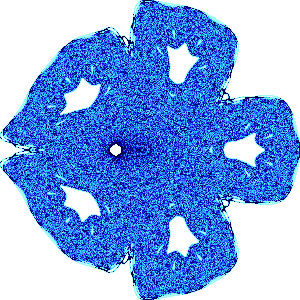
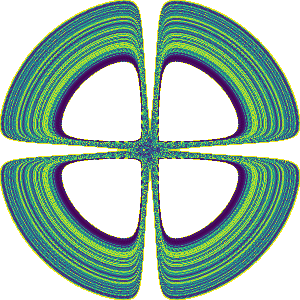
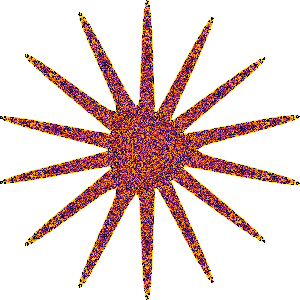

In [18]:
@jit(nopython=True)
def G(x, mu):
    return mu * x + 2 * (1 - mu) * x**2 / (1.0 + x**2)

@jit(nopython=True)
def Gumowski_Mira(x, y, a, b, mu, *o):
    xn = y + a*(1 - b*y**2)*y  +  G(x, mu)
    yn = -x + G(xn, mu)
    return xn, yn

plot(Gumowski_Mira)

##  Symmetric Icon Attractor

The Hopalong and Gumowski-Mira equations often result in symmetric patterns, but a different approach is to *force* the patterns to be symmetric, which is often pleasing. Examples from “Symmetry in Chaos” by Michael Field and Martin Golubitsky, with code and parameters from [Jason Rampe](https://softologyblog.wordpress.com/2017/03/04/2d-strange-attractors):

"0.01, 0.01, 1.8, 0.0, 1.0, 0.1, -1.93, 5","0.01, 0.01, 5.0, -1.0, 1.0, 0.188, -2.5, 5","0.01, 0.01, -1.0, 0.1, -0.82, 0.12, 1.56, 3","0.01, 0.01, 1.806, 0.0, 1.0, 0.0, -1.806, 5"
"0.01, 0.01, 10.0, -12.0, 1.0, 0.0, -2.195, 3","0.01, 0.01, -2.5, 0.0, 0.9, 0.0, 2.5, 3","0.01, 0.01, 3.0, -16.79, 1.0, 0.0, -2.05, 9","0.01, 0.01, 5.0, 1.5, 1.0, 0.0, -2.7, 6"
"0.01, 0.01, 1.0, -0.1, 0.167, 0.0, -2.08, 7","0.01, 0.01, 2.32, 0.0, 0.75, 0.0, -2.32, 5","0.01, 0.01, -2.0, 0.0, -0.5, 0.0, 2.6, 5","0.01, 0.01, 2.0, 0.2, 0.1, 0.0, -2.34, 5"
"0.01, 0.01, 2.0, 0.0, 1.0, 0.1, -1.86, 4","0.01, 0.01, -1.0, 0.1, -0.82, 0.0, 1.56, 3","0.01, 0.01, -1.0, 0.03, -0.8, 0.0, 1.455, 3","0.01, 0.01, -2.5, -0.1, 0.9, -0.15, 2.39, 16"

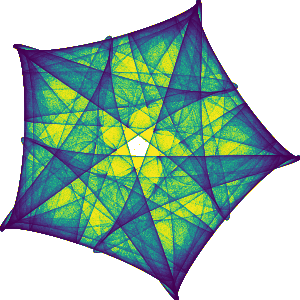
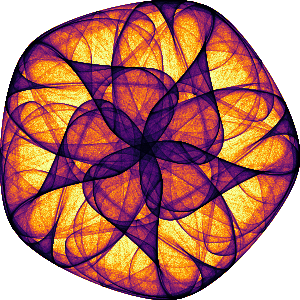
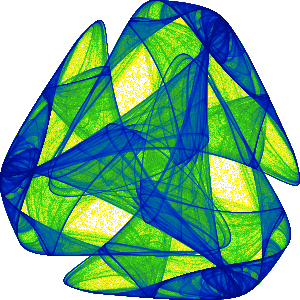
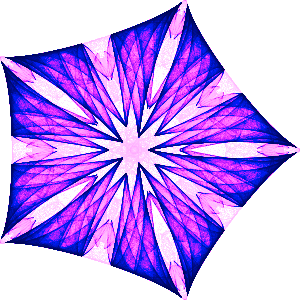
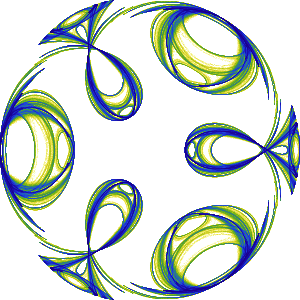
...
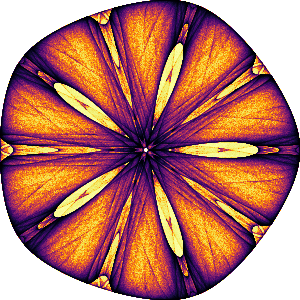
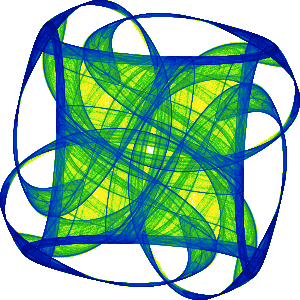
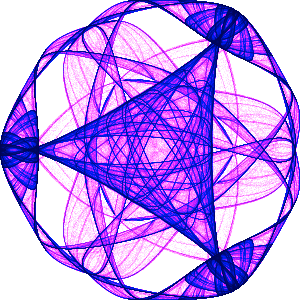
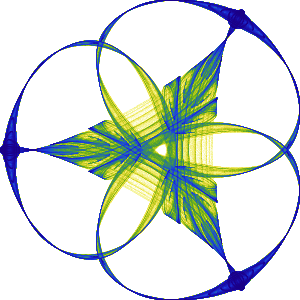
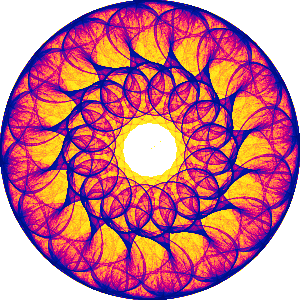

In [19]:
@jit(nopython=True)
def Symmetric_Icon(x, y, a, b, g, om, l, d, *o):
    zzbar = x*x + y*y
    p = a*zzbar + l
    zreal, zimag = x, y

    for i in range(1, d-1):
        za, zb = zreal * x - zimag * y, zimag * x + zreal * y
        zreal, zimag = za, zb

    zn = x*zreal - y*zimag
    p += b*zn

    return p*x + g*zreal - om*y, p*y - g*zimag + om*x

plot(Symmetric_Icon)

## Interactive plotting

If you are running a live Python process, you can use Datashader with HoloViews and Bokeh to zoom in and see the individual steps in any of these calculations:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
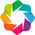

:DynamicMap   []
   :Image   [x,y]   (x_y Count)

In [20]:
import holoviews as hv
from holoviews.operation.datashader import rasterize, dynspread
hv.extension('bokeh')

pts = hv.Points(trajectory(Clifford, *(args("Clifford")[5][1:])))
dynspread(rasterize(pts).opts(cnorm='eq_hist', width=400,height=400))

Each time you zoom in in a live process, the data will be reaggregated, which should take a small fraction of a second for 10 million points.  Eventually, once you zoom in enough you should see individual data points, as we are not connecting the points into a trajectory here. 

You can also try "connecting the dots", which will reveal how the particle jumps discretely from one region of the space to another:

In [21]:
pth = hv.Path([trajectory(Clifford, *(args("Clifford")[5][1:]))])
dynspread(rasterize(pth).opts(cnorm='eq_hist', width=400,height=400))

:DynamicMap   []
   :Image   [x,y]   (x_y Count)

Again, if you zoom in on a live server, the plot will update so that you can see the individual traces involved. 

On the live server, you can also explore to find your own parameter values that generate interesting patterns:

In [22]:
def hv_clif(a,b,c,d,x0=0,y0=0,n=n):
    return hv.Points(trajectory(Clifford, x0, y0, a, b, c, d, n))

x0,y0,a,b,c,d = args("Clifford")[6][1:]

dm = hv.DynamicMap(hv_clif, kdims=['a', 'b', 'c', 'd'])
dm = dm.redim.range(a=(-2.0, 2.0), b=(-2.0,2.0), c=(-2.0,2.0), d=(-2.0,2.0))
dm = dm.redim.default(a=a, b=b, c=c, d=d)

dynspread(rasterize(dm)).opts(cmap='kgy_r', cnorm='eq_hist', width=500,height=500)

:DynamicMap   [a,b,c,d]
   :Image   [x,y]   (x_y Count)

Although many of the regions of this four-dimensional parameter space generate uninteresting trajectories such as single points, you can find interesting regions by starting with one of the _a,b,c,d_ tuples of values in previous plots, then click on one slider and use the left and right arrow keys to see how the plot changes as that parameter changes. See also this [Panel](http://panel.pyviz.org)-based [attractor dashboard](https://anaconda.org/jbednar/datashaderattractors).